In [1]:
from diffusers import AutoencoderKL, UNet2DConditionModel, UniPCMultistepScheduler
from PIL import Image
import numpy as np
import torch
from transformers import CLIPTextModel, CLIPTokenizer
import matplotlib.pyplot as plt

c:\Users\silvr\anaconda3\envs\Diffuser\Lib\site-packages\transformers\utils\generic.py:441: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(
c:\Users\silvr\anaconda3\envs\Diffuser\Lib\site-packages\transformers\utils\generic.py:309: UserWarning: torch.utils._pytree._register_pytree_node is deprecated. Please use torch.utils._pytree.register_pytree_node instead.
  _torch_pytree._register_pytree_node(


In [2]:
vae = AutoencoderKL.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="vae", use_safetensors=True)
tokenizer = CLIPTokenizer.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(
    "runwayml/stable-diffusion-v1-5", subfolder="text_encoder", use_safetensors=True
)
unet = UNet2DConditionModel.from_pretrained(
    "runwayml/stable-diffusion-v1-5", subfolder="unet", use_safetensors=True
)
scheduler = UniPCMultistepScheduler.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="scheduler")
torch_device = "cuda"
vae.to(torch_device)
text_encoder.to(torch_device)
unet.to(torch_device)

UNet2DConditionModel(
  (conv_in): Conv2d(4, 320, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (time_proj): Timesteps()
  (time_embedding): TimestepEmbedding(
    (linear_1): Linear(in_features=320, out_features=1280, bias=True)
    (act): SiLU()
    (linear_2): Linear(in_features=1280, out_features=1280, bias=True)
  )
  (down_blocks): ModuleList(
    (0): CrossAttnDownBlock2D(
      (attentions): ModuleList(
        (0-1): 2 x Transformer2DModel(
          (norm): GroupNorm(32, 320, eps=1e-06, affine=True)
          (proj_in): Conv2d(320, 320, kernel_size=(1, 1), stride=(1, 1))
          (transformer_blocks): ModuleList(
            (0): BasicTransformerBlock(
              (norm1): LayerNorm((320,), eps=1e-05, elementwise_affine=True)
              (attn1): Attention(
                (to_q): Linear(in_features=320, out_features=320, bias=False)
                (to_k): Linear(in_features=320, out_features=320, bias=False)
                (to_v): Linear(in_features=320, out_fe

In [3]:
prompt = ["a photograph of an astronaut  riding a horse"]
height = 512  # default height of Stable Diffusion
width = 512  # default width of Stable Diffusion
num_inference_steps = 30  # Number of denoising steps
guidance_scale = 7.5  # Scale for classifier-free guidance
generator = torch.manual_seed(0)  # Seed generator to create the initial latent noise
batch_size = len(prompt)

In [4]:
text_input = tokenizer(
    prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt"
)

with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

In [5]:
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer([""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]

In [6]:
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

In [7]:
latents = torch.randn(
    (batch_size, unet.config.in_channels, height // 8, width // 8),
    generator=torch.Generator(device='cuda'),
    device=torch_device,
)


In [8]:
latents = latents * scheduler.init_noise_sigma

In [9]:
from tqdm.auto import tqdm
images = []
visualize_every_n_steps = max(len(scheduler.timesteps) // 10, 1)
scheduler.set_timesteps(num_inference_steps)

for t in tqdm(scheduler.timesteps):    
    latent_model_input = torch.cat([latents] * 2)
    latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler.step(noise_pred, t, latents).prev_sample
    if t % visualize_every_n_steps == 0 or t == scheduler.timesteps[-1]:  # Save at intervals and the last step
        with torch.no_grad():
            # Scale and decode to get the image at the current timestep
            tmp_latents = 1 / 0.18215 * latents
            tmp_image = vae.decode(tmp_latents).sample
        tmp_image = (tmp_image / 2 + 0.5).clamp(0, 1).squeeze()
        tmp_image = (tmp_image.permute(1, 2, 0) * 255).to(torch.uint8).cpu().numpy()
        tmp_processed_image = Image.fromarray(tmp_image)
        images.append(tmp_processed_image)

  0%|          | 0/30 [00:00<?, ?it/s]

c:\Users\silvr\anaconda3\envs\Diffuser\Lib\site-packages\diffusers\models\attention_processor.py:1255: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at ..\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:281.)
  hidden_states = F.scaled_dot_product_attention(


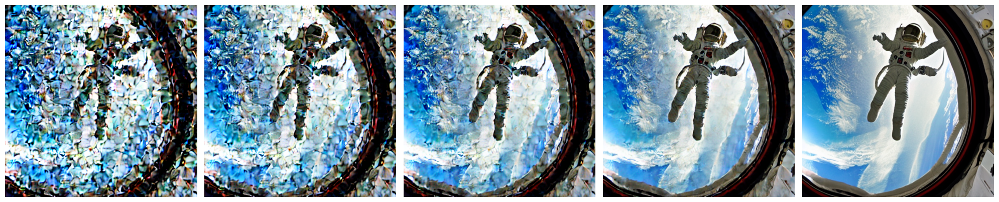

In [10]:
# scale and decode the import matplotlib.pyplot as plt
images_per_row = 5

# Calculate the number of rows needed
num_rows = len(images) // images_per_row + (0 if len(images) % images_per_row == 0 else 1)

# Set figure size (optional)
plt.figure(figsize=(20, num_rows * 6))

# Loop through all the images and plot them
for i, image in enumerate(images):
    plt.subplot(num_rows, images_per_row, i + 1)
    plt.imshow(image)
    plt.axis('off')  # Turn off axis numbers and ticks

plt.tight_layout()  # Adjust subplots to fit into figure area.
plt.show()  # Display the plotimage latents with vae


In [11]:
from diffusers import DiffusionPipeline
from diffusers.schedulers import (
    DPMSolverSinglestepScheduler,
    DEISMultistepScheduler,
    LMSDiscreteScheduler,
    EulerAncestralDiscreteScheduler,
    DPMSolverMultistepScheduler,
    KDPM2AncestralDiscreteScheduler,
    PNDMScheduler,
    EulerDiscreteScheduler,
    UniPCMultistepScheduler,
    DDIMScheduler,
    DPMSolverSDEScheduler,
    KDPM2DiscreteScheduler,
    DDPMScheduler,
    HeunDiscreteScheduler,
)
pipeline = DiffusionPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16, use_safetensors=True
)


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


  0%|          | 0/50 [00:00<?, ?it/s]

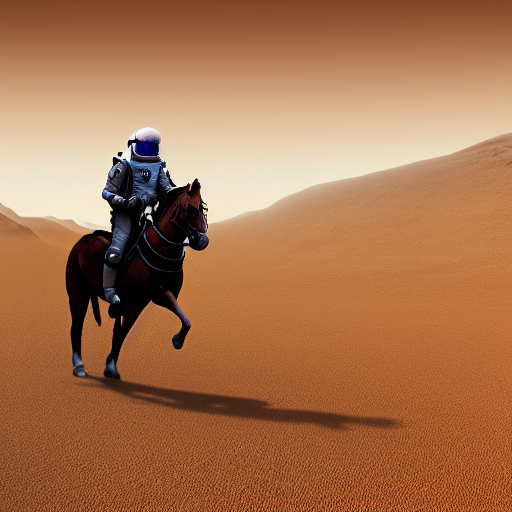

In [12]:
pipeline.to("cuda")
pipeline.scheduler = DPMSolverMultistepScheduler.from_config(pipeline.scheduler.config)
prompt = "A photograph of an astronaut riding a horse on Mars, high resolution, high definition."
generator = torch.Generator(device="cuda").manual_seed(8)
image = pipeline(prompt, generator=generator).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

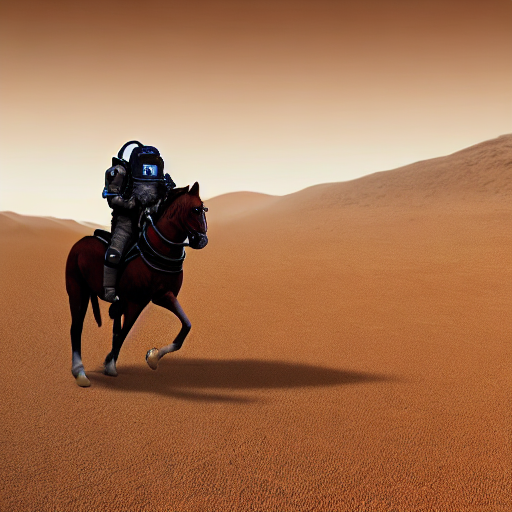

In [13]:
pipeline.to("cuda")
pipeline.scheduler = PNDMScheduler.from_config(pipeline.scheduler.config)
prompt = "A photograph of an astronaut riding a horse on Mars, high resolution, high definition."
generator = torch.Generator(device="cuda").manual_seed(8)
image = pipeline(prompt, generator=generator).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

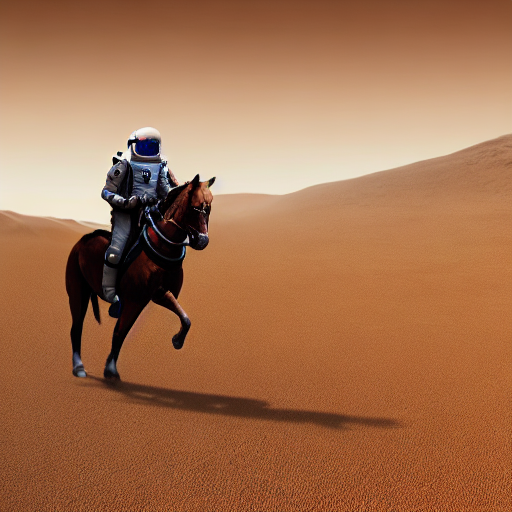

In [14]:
pipeline.to("cuda")
pipeline.scheduler = DDIMScheduler.from_config(pipeline.scheduler.config)
prompt = "A photograph of an astronaut riding a horse on Mars, high resolution, high definition."
generator = torch.Generator(device="cuda").manual_seed(8)
image = pipeline(prompt, generator=generator).images[0]
image

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

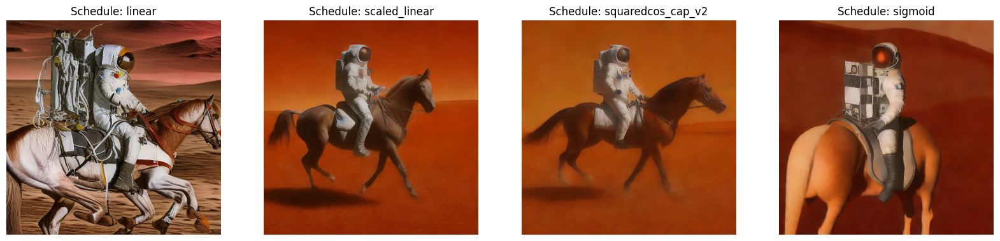

In [15]:
pipeline.to("cuda")

schedules = ["linear", "scaled_linear", "squaredcos_cap_v2", "sigmoid"]
images = []
prompt = "A photograph of an astronaut riding a horse on Mars, high resolution, high definition."

for schedule in schedules:
    # Assuming DDPMScheduler and pipeline are correctly initialized and configured
    scheduler = DDPMScheduler(num_train_timesteps=1000, beta_start=0.0001, beta_end=0.02, beta_schedule=schedule)
    pipeline.scheduler = scheduler
    generator = torch.Generator(device="cuda").manual_seed(666)
    output = pipeline(prompt, generator=generator)
    images.append(output.images[0])  # Assuming this is how you access generated images

# Assuming 'images' is a list of PIL.Image objects or similar
fig, axs = plt.subplots(1, len(images), figsize=(20, 10))
for i, img in enumerate(images):
    axs[i].imshow(img)
    axs[i].set_title(f"Schedule: {schedules[i]}")
    axs[i].axis('off')  # Hide axes for cleaner visualization

plt.show()

c:\Users\silvr\anaconda3\envs\Diffuser\Lib\site-packages\diffusers\configuration_utils.py:139: FutureWarning: Accessing config attribute `num_train_timesteps` directly via 'DDPMScheduler' object attribute is deprecated. Please access 'num_train_timesteps' over 'DDPMScheduler's config object instead, e.g. 'scheduler.config.num_train_timesteps'.
  deprecate("direct config name access", "1.0.0", deprecation_message, standard_warn=False)
c:\Users\silvr\anaconda3\envs\Diffuser\Lib\site-packages\diffusers\schedulers\scheduling_ddpm.py:310: RuntimeWarning: divide by zero encountered in scalar floor_divide
  step_ratio = self.config.num_train_timesteps // self.num_inference_steps


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

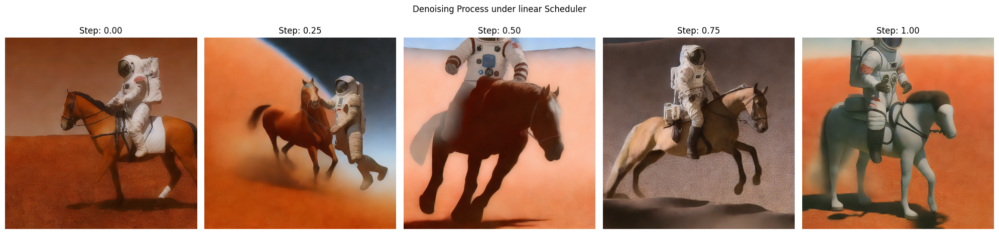

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

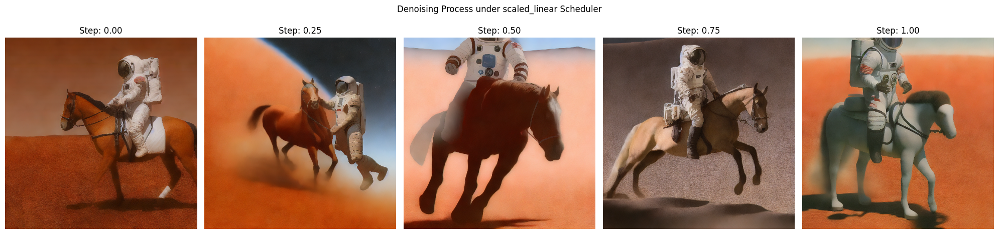

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

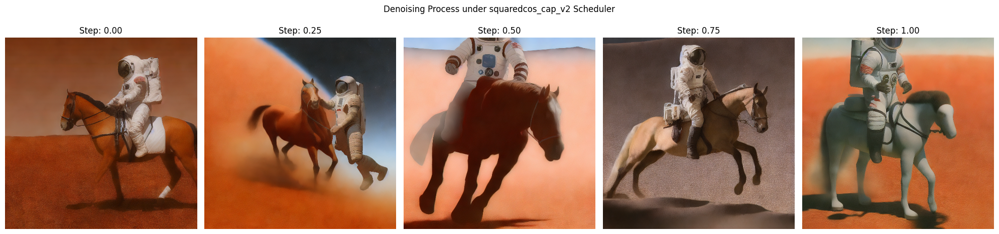

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

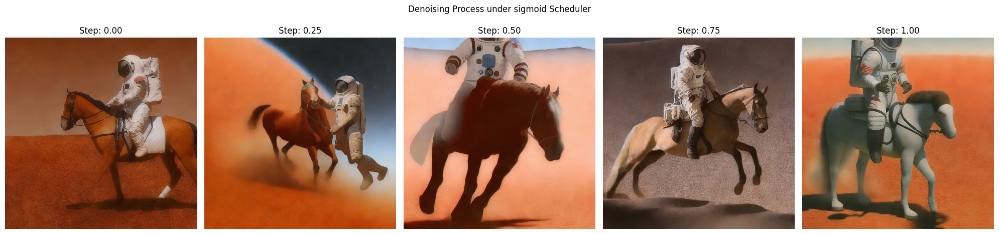

In [16]:
import matplotlib.pyplot as plt
import numpy as np

def generate_and_plot_denoising(pipeline, scheduler_name, prompt, num_steps, seed):

    # List to store generated images at different timesteps
    images = []

    # Generator for reproducibility
    generator = torch.Generator(device="cuda").manual_seed(seed)

    # Modify this part to generate images at specific timesteps
    # This is a placeholder loop; the actual implementation depends on your model and pipeline
    for step in np.linspace(start=0, stop=pipeline.scheduler.num_train_timesteps-1, num=num_steps, dtype=int):
        pipeline.scheduler.set_timesteps(step)  # Placeholder method
        output = pipeline(prompt, generator=generator)
        images.append(output.images[0])  # Assuming this method to access generated images

    # Plotting
    fig, axs = plt.subplots(1, len(images), figsize=(20, 5))
    for i, img in enumerate(images):
        axs[i].imshow(img)  # Assuming img is displayable by imshow
        axs[i].set_title(f"Step: {np.linspace(0, 1, num=num_steps)[i]:.2f}")
        axs[i].axis('off')
    plt.suptitle(f"Denoising Process under {scheduler_name} Scheduler")
    plt.tight_layout()
    plt.show()

# Example usage
schedules = ["linear", "scaled_linear", "squaredcos_cap_v2", "sigmoid"]
prompt = "A photograph of an astronaut riding a horse on Mars, high resolution, high definition."
num_steps = 5  # Number of steps to visualize
seed = 42  # Random seed

for schedule in schedules:
    generate_and_plot_denoising(pipeline, schedule, prompt, num_steps, seed)


  0%|          | 0/30 [00:00<?, ?it/s]

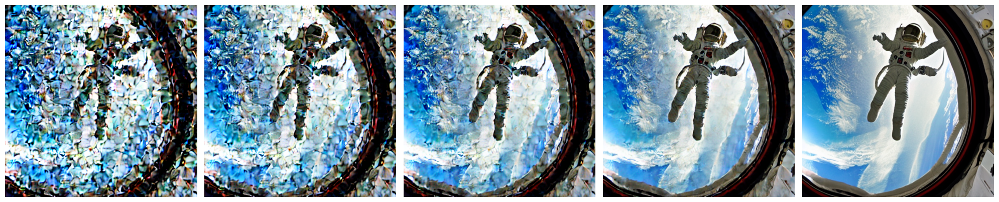

In [17]:
from diffusers import AutoencoderKL, UNet2DConditionModel, UniPCMultistepScheduler
from PIL import Image
import numpy as np
import torch
from transformers import CLIPTextModel, CLIPTokenizer
import matplotlib.pyplot as plt

vae = AutoencoderKL.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="vae", use_safetensors=True)
tokenizer = CLIPTokenizer.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained(
    "runwayml/stable-diffusion-v1-5", subfolder="text_encoder", use_safetensors=True
)
unet = UNet2DConditionModel.from_pretrained(
    "runwayml/stable-diffusion-v1-5", subfolder="unet", use_safetensors=True
)
scheduler = UniPCMultistepScheduler.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="scheduler")
torch_device = "cuda"
vae.to(torch_device)
text_encoder.to(torch_device)
unet.to(torch_device)

prompt = ["a photograph of an astronaut  riding a horse"]
height = 512  # default height of Stable Diffusion
width = 512  # default width of Stable Diffusion
num_inference_steps = 30  # Number of denoising steps
guidance_scale = 7.5  # Scale for classifier-free guidance
generator = torch.manual_seed(0)  # Seed generator to create the initial latent noise
batch_size = len(prompt)

text_input = tokenizer(
    prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt"
)

with torch.no_grad():
    text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]

max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer([""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

latents = torch.randn(
    (batch_size, unet.config.in_channels, height // 8, width // 8),
    generator=torch.Generator(device='cuda'),
    device=torch_device,
)


from tqdm.auto import tqdm
images = []
visualize_every_n_steps = max(len(scheduler.timesteps) // 10, 1)
scheduler.set_timesteps(num_inference_steps)

for t in tqdm(scheduler.timesteps):    
    latent_model_input = torch.cat([latents] * 2)
    latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

    with torch.no_grad():
        noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

    # compute the previous noisy sample x_t -> x_t-1
    latents = scheduler.step(noise_pred, t, latents).prev_sample
    if t % visualize_every_n_steps == 0 or t == scheduler.timesteps[-1]:  # Save at intervals and the last step
        with torch.no_grad():
            # Scale and decode to get the image at the current timestep
            tmp_latents = 1 / 0.18215 * latents
            tmp_image = vae.decode(tmp_latents).sample
        tmp_image = (tmp_image / 2 + 0.5).clamp(0, 1).squeeze()
        tmp_image = (tmp_image.permute(1, 2, 0) * 255).to(torch.uint8).cpu().numpy()
        tmp_processed_image = Image.fromarray(tmp_image)
        images.append(tmp_processed_image)


# scale and decode the import matplotlib.pyplot as plt
images_per_row = 5

# Calculate the number of rows needed
num_rows = len(images) // images_per_row + (0 if len(images) % images_per_row == 0 else 1)

# Set figure size (optional)
plt.figure(figsize=(20, num_rows * 6))

# Loop through all the images and plot them
for i, image in enumerate(images):
    plt.subplot(num_rows, images_per_row, i + 1)
    plt.imshow(image)
    plt.axis('off')  # Turn off axis numbers and ticks

plt.tight_layout()  # Adjust subplots to fit into figure area.
plt.show()  # Display the plotimage latents with vae


Processing linear schedule...


  0%|          | 0/30 [00:00<?, ?it/s]

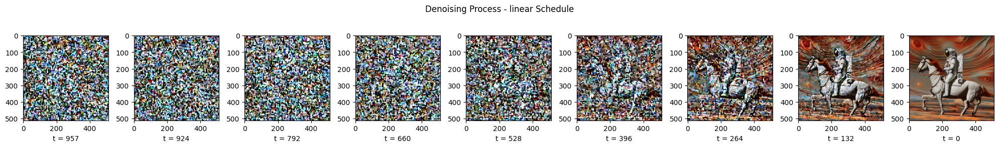

Processing scaled_linear schedule...


  0%|          | 0/30 [00:00<?, ?it/s]

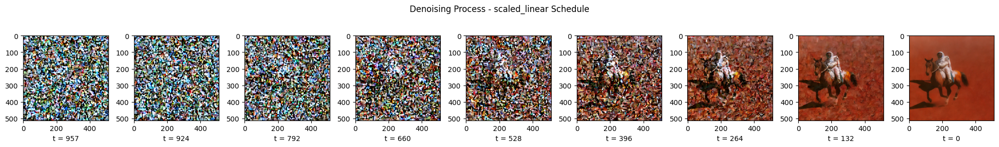

Processing squaredcos_cap_v2 schedule...


  0%|          | 0/30 [00:00<?, ?it/s]

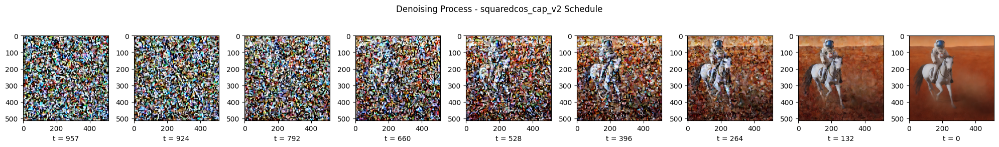

Processing sigmoid schedule...


  0%|          | 0/30 [00:00<?, ?it/s]

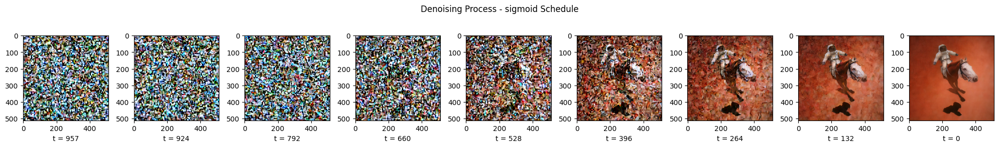

In [18]:
from diffusers import AutoencoderKL, UNet2DConditionModel, UniPCMultistepScheduler
from PIL import Image
import numpy as np
import torch
from transformers import CLIPTextModel, CLIPTokenizer
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

# Initialize components
vae = AutoencoderKL.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="vae", use_safetensors=True)
tokenizer = CLIPTokenizer.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="tokenizer")
text_encoder = CLIPTextModel.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="text_encoder", use_safetensors=True)
unet = UNet2DConditionModel.from_pretrained("runwayml/stable-diffusion-v1-5", subfolder="unet", use_safetensors=True)
torch_device = "cuda"
vae.to(torch_device)
text_encoder.to(torch_device)
unet.to(torch_device)

# Settings
prompt = ["a photograph of an astronaut riding a horse on Mars, high resolution, high definition."]
height, width = 512, 512  # Stable Diffusion default dimensions
num_inference_steps = 30
guidance_scale = 7.5
batch_size = len(prompt)

# Tokenize prompt
text_input = tokenizer(prompt, padding="max_length", max_length=tokenizer.model_max_length, truncation=True, return_tensors="pt")
text_embeddings = text_encoder(text_input.input_ids.to(torch_device))[0]
max_length = text_input.input_ids.shape[-1]
uncond_input = tokenizer([""] * batch_size, padding="max_length", max_length=max_length, return_tensors="pt")
uncond_embeddings = text_encoder(uncond_input.input_ids.to(torch_device))[0]
text_embeddings = torch.cat([uncond_embeddings, text_embeddings])

# Initialize latents
cuda_generator = torch.Generator(device='cuda')
cuda_generator.manual_seed(666)
initial_latents = torch.randn(
    (batch_size, unet.config.in_channels, height // 8, width // 8),
    generator=cuda_generator,
    device=torch_device
)

# Beta schedules to iterate over
beta_schedules = ["linear", "scaled_linear", "squaredcos_cap_v2", "sigmoid"]

# Loop over beta_schedules
for beta_schedule in beta_schedules:
    print(f"Processing {beta_schedule} schedule...")
    scheduler = DDPMScheduler(beta_start=0.0001, beta_end=0.02, num_train_timesteps=1000, beta_schedule=beta_schedule)
    latents = initial_latents.clone()
    images = []
    timeStamp = []
    scheduler.set_timesteps(num_inference_steps)

    for t in tqdm(scheduler.timesteps):    
        latent_model_input = torch.cat([latents] * 2)
        latent_model_input = scheduler.scale_model_input(latent_model_input, timestep=t)

        with torch.no_grad():
            noise_pred = unet(latent_model_input, t, encoder_hidden_states=text_embeddings).sample

        noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
        noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

        latents = scheduler.step(noise_pred, t, latents).prev_sample
        if t == int(scheduler.timesteps[0]) or t % 4 == 0 or t == scheduler.timesteps[-1]:  # Visualize at intervals and the last step
            with torch.no_grad():
                tmp_latents = 1 / 0.18215 * latents
                tmp_image = vae.decode(tmp_latents).sample
            tmp_image = (tmp_image / 2 + 0.5).clamp(0, 1).squeeze()
            tmp_image = (tmp_image.permute(1, 2, 0) * 255).to(torch.uint8).cpu().numpy()
            images.append(Image.fromarray(tmp_image))
            timeStamp.append(t)

    # Plot the images for the current beta_schedule
    images_per_row = 9
    num_rows = len(images) // images_per_row + (0 if len(images) % images_per_row == 0 else 1)
    fig, axs = plt.subplots(num_rows, images_per_row, figsize=(20, num_rows * 2.8))
    axs = axs.flatten()
    for i, image in enumerate(images):
        ax = axs[i]
        ax.imshow(image)
        # ax.axis('off')
        ax.set_xlabel(f"t = {timeStamp[i]}")

    plt.suptitle(f"Denoising Process - {beta_schedule} Schedule")
    plt.tight_layout()
    plt.show()


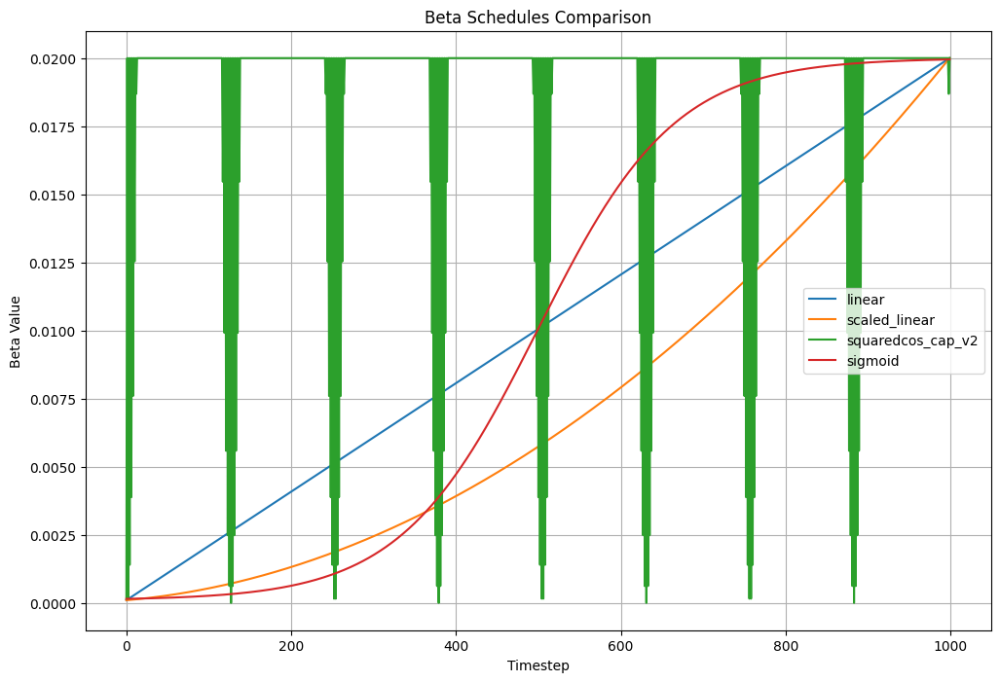

In [111]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def plot_beta_schedules(num_timesteps=1000, beta_start=0.0001, beta_end=0.02):
    # Define the schedules
    schedules = {
        "linear": torch.linspace(beta_start, beta_end, num_timesteps),
        "scaled_linear": (torch.linspace(np.sqrt(beta_start), np.sqrt(beta_end), num_timesteps))**2,
        "squaredcos_cap_v2": (lambda num_steps: torch.tensor([
            min(1 - np.cos((t + 0.008) / 1.008 * np.pi / 2) ** 2, beta_end) for t in range(num_steps)
        ]))(num_timesteps),
        "sigmoid": (lambda num_steps: torch.sigmoid(
            torch.linspace(-6, 6, num_steps)
        ) * (beta_end - beta_start) + beta_start)(num_timesteps),
    }

    # Plot each schedule
    plt.figure(figsize=(12, 8))
    for name, values in schedules.items():
        plt.plot(values.numpy(), label=name)

    plt.title('Beta Schedules Comparison')
    plt.xlabel('Timestep')
    plt.ylabel('Beta Value')
    plt.legend()
    plt.grid(True)
    plt.show()

# Plot the comparison of beta schedules
plot_beta_schedules()


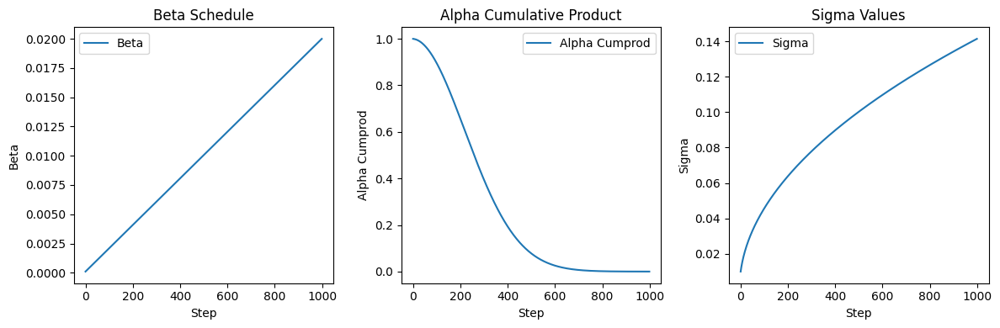

In [274]:
import torch
import matplotlib.pyplot as plt

num_steps = 1000
beta_start = 0.0001
beta_end = 0.02
betas = torch.linspace(beta_start, beta_end, num_steps)  # Linear schedule for beta

alphas = 1.0 - betas
alphas_cumprod = torch.cumprod(alphas, dim=0)
sigmas = torch.sqrt(betas)  # Simplified assumption for visualization

# Plotting
plt.figure(figsize=(12, 4))
plt.subplot(1, 3, 1)
plt.plot(betas.numpy(), label='Beta')
plt.title('Beta Schedule')
plt.xlabel('Step')
plt.ylabel('Beta')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(alphas_cumprod.numpy(), label='Alpha Cumprod')
plt.title('Alpha Cumulative Product')
plt.xlabel('Step')
plt.ylabel('Alpha Cumprod')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(sigmas.numpy(), label='Sigma')
plt.title('Sigma Values')
plt.xlabel('Step')
plt.ylabel('Sigma')
plt.legend()

plt.tight_layout()
plt.show()


In [3]:
def cads_linear_schedule(t, tau1, tau2):
    """ CADS annealing schedule function """
    if t <= tau1:
            return 1.0              # 0.0 is the phase 1 noise level
    if t>= tau2:
            return 0.0              # 1.0 is the phase 3 noise level
    gamma = (tau2-t)/(tau2-tau1)    # Linear interpolation between phase 1 and phase 3
    return gamma

In [20]:
def ours_sigmoid_1_schedule(t, tau1, tau2, k=1.0):
    """CADS sigmoid annealing schedule function"""
    if t <= tau1:
        return 1.0
    if t >= tau2:
        return 0.0
    # Adjust the steepness with 'k'
    gamma = 1 / (1 + np.exp(-k * ((t - tau1) / (tau2 - tau1) - 0.5)))
    return gamma

def ours_sigmoid_2_schedule(t, tau1, tau2, k=0.0):
    """CADS sigmoid annealing schedule function"""
    if t <= tau1:
        return 1.0
    if t >= tau2:
        return 0.0
    # Adjust the steepness with 'k'
    gamma = 1 / (1 + np.exp(-k * ((t - tau1) / (tau2 - tau1) - 0.5)))
    return gamma

def cads_exponential_schedule(t, tau1, tau2, a=10.0):
    """CADS exponential annealing schedule function"""
    if t <= tau1:
        return 1.0
    if t >= tau2:
        return 0.0
    gamma = np.exp(-a * (t - tau1) / (tau2 - tau1))
    return gamma

def cads_absolute_schedule(t, tau1, tau2, midpoint= 0.75):
    """CADS absolute annealing schedule function"""
    if t <= tau1:
        return 1.0
    if t >= tau2:
        return 0.0
    gamma = 1 - abs((t - midpoint) / (tau2 - tau1))
    return max(0.0, gamma)

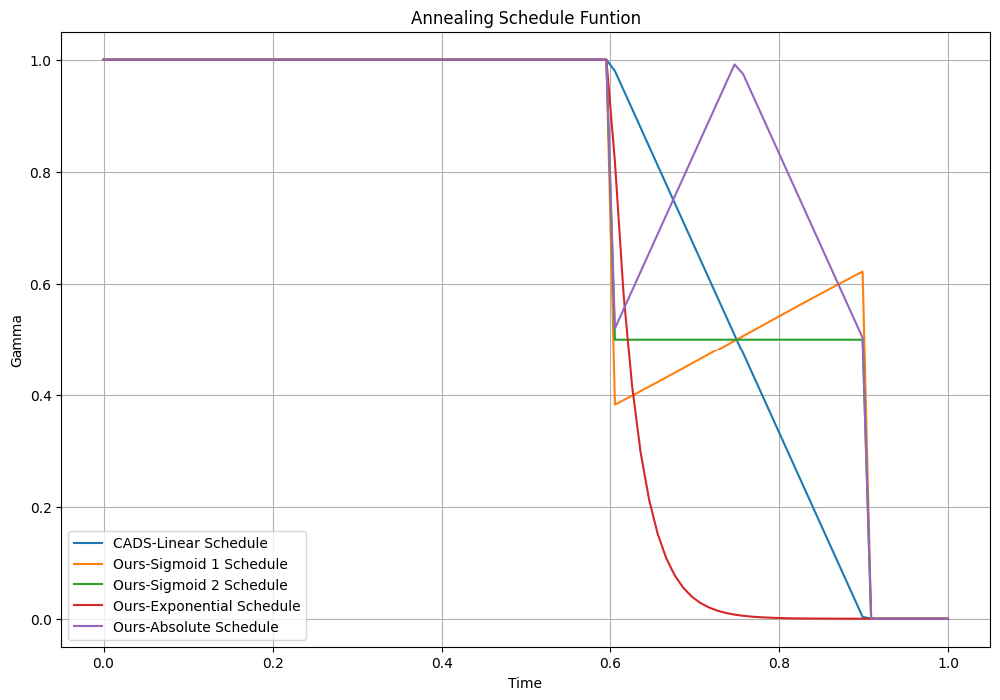

In [37]:


time_steps = np.linspace(0, 1, 100)  # Assuming we want to plot for 30 time steps
cads_linear_schedule_values = [cads_linear_schedule(t, 0.6, 0.9) for t in time_steps]
cads_sigmoid_1_schedule_values = [ours_sigmoid_1_schedule(t, 0.6, 0.9) for t in time_steps]
cads_sigmoid_2_schedule_values = [ours_sigmoid_2_schedule(t, 0.6, 0.9) for t in time_steps]
cads_exponential_schedule_values = [cads_exponential_schedule(t, 0.6, 0.9) for t in time_steps]
cads_absolute_schedule_values = [cads_absolute_schedule(t, 0.6, 0.9) for t in time_steps]

# Plotting the gamma value as it changes over time
plt.figure(figsize=(12, 8))
plt.plot(time_steps, cads_linear_schedule_values, label="CADS-Linear Schedule")
plt.plot(time_steps, cads_sigmoid_1_schedule_values, label="Ours-Sigmoid 1 Schedule")
plt.plot(time_steps, cads_sigmoid_2_schedule_values, label="Ours-Sigmoid 2 Schedule")
plt.plot(time_steps, cads_exponential_schedule_values, label="Ours-Exponential Schedule")
plt.plot(time_steps, cads_absolute_schedule_values, label="Ours-Absolute Schedule")

plt.title('Annealing Schedule Funtion')
plt.xlabel('Time')
plt.ylabel('Gamma')
plt.legend()
plt.grid(True)
plt.show()